<a href="https://colab.research.google.com/github/KhushiY215/C-UAS-KF-Defense-Proximity-Prioritized-Drone-Defense-Simulation-with-KF-Tracking/blob/main/C_UAS_KF_Guided_Drone_Defense.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install numpy matplotlib filterpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110460 sha256=2b9d46be238e88dff9a90818a74f7d5a31bfe9497ccd874bc494100dbdd25485
  Stored in directory: /root/.cache/pip/wheels/77/bf/4c/b0c3f4798a0166668752312a67118b27a3cd341e13ac0ae6ee
Successfully built filterpy


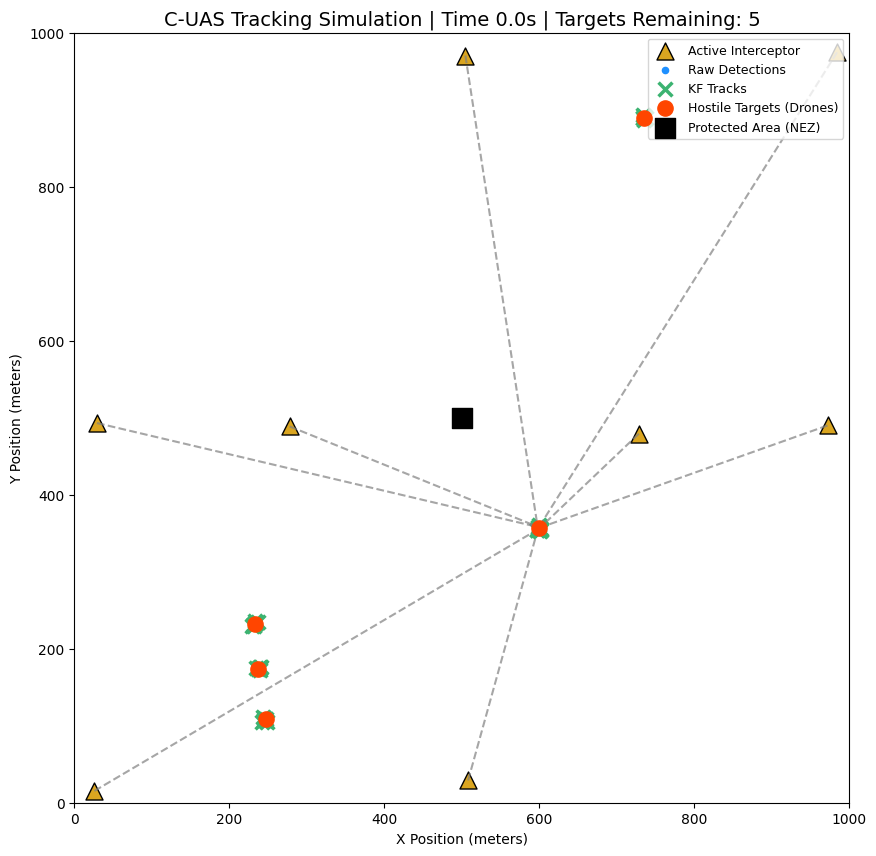

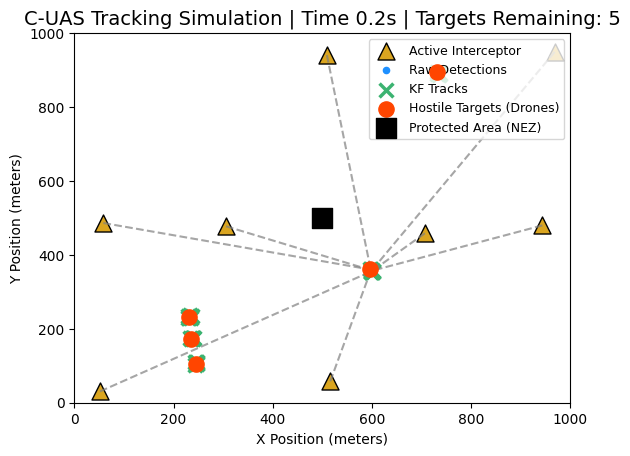

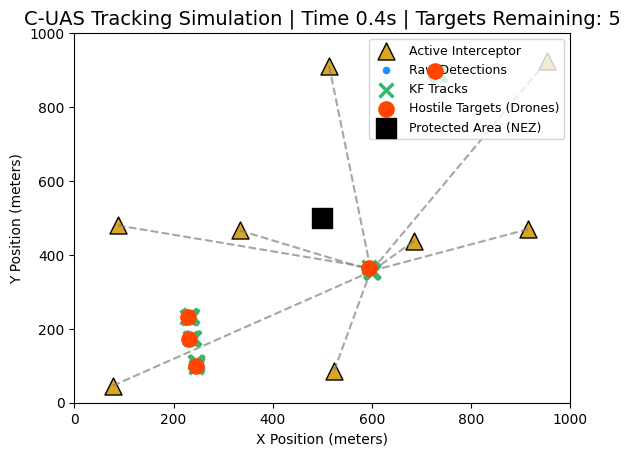

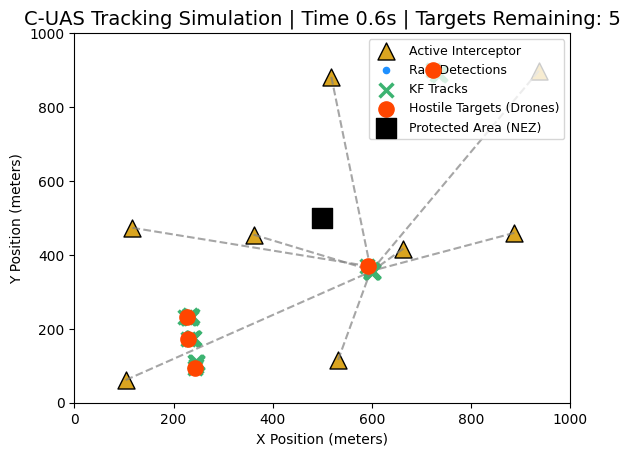

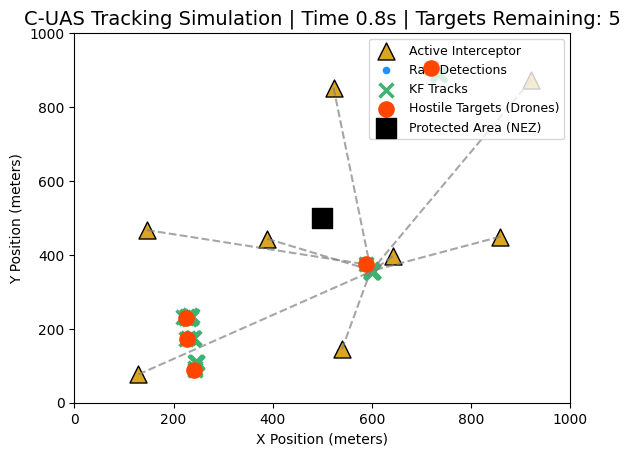

...

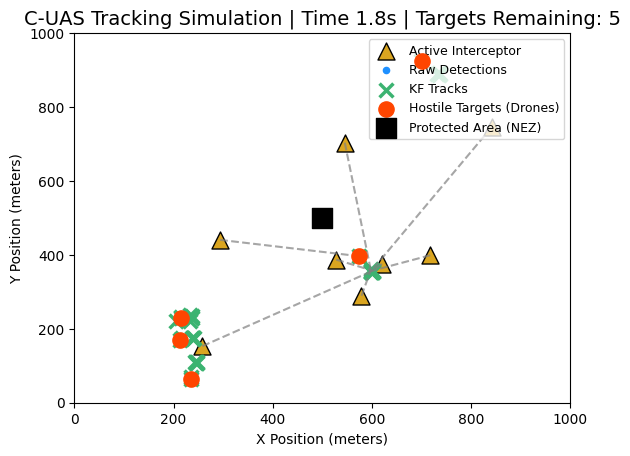

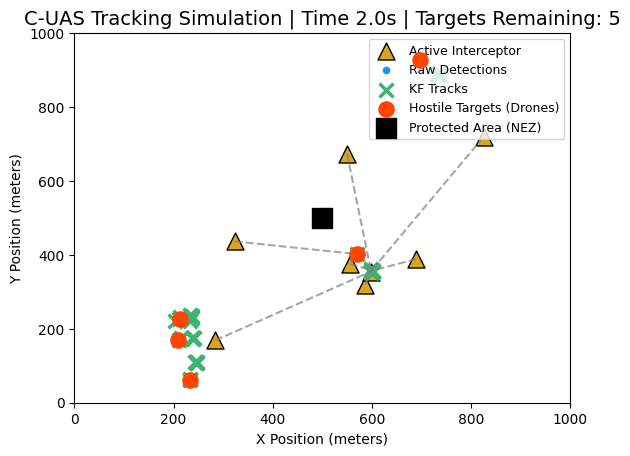

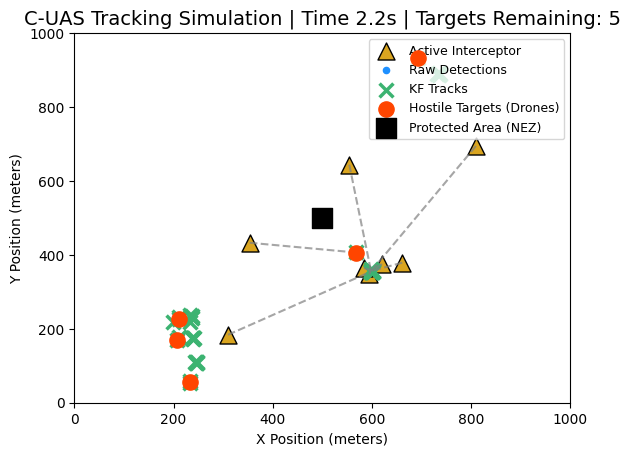

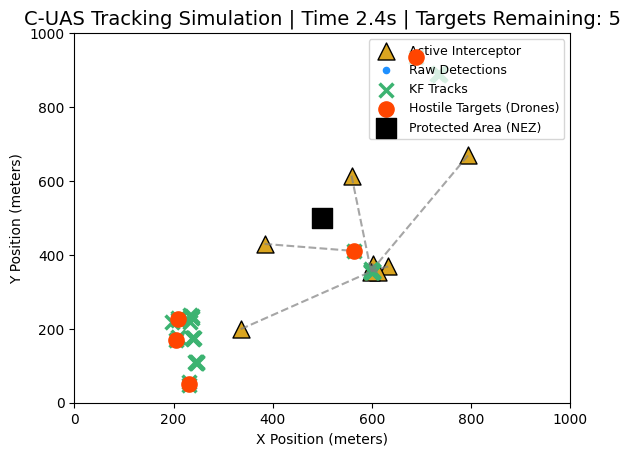

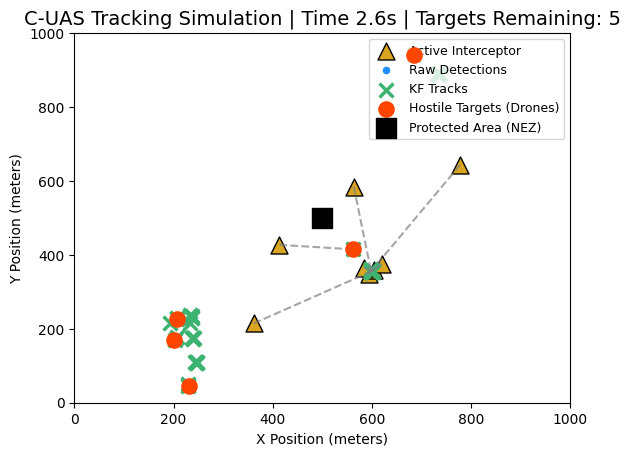

!!! WARNING: Hostile Target 2 penetrated the Protected Area at time 2.8s !!!


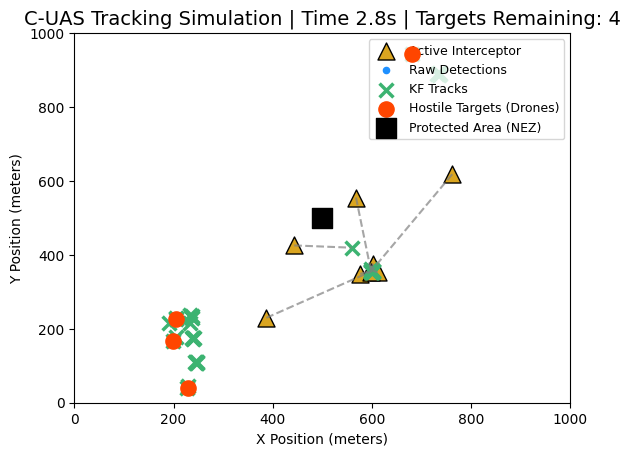

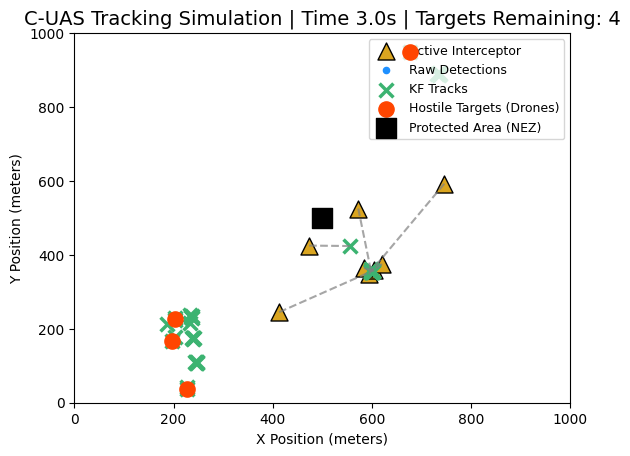

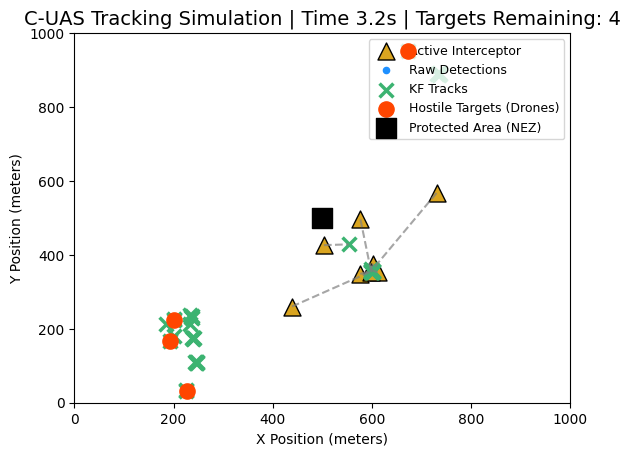

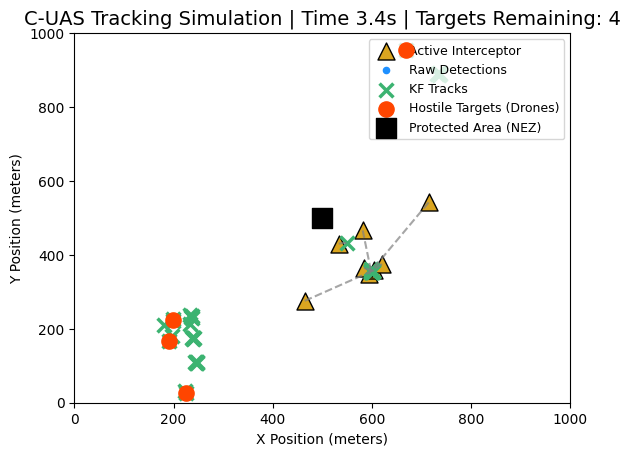

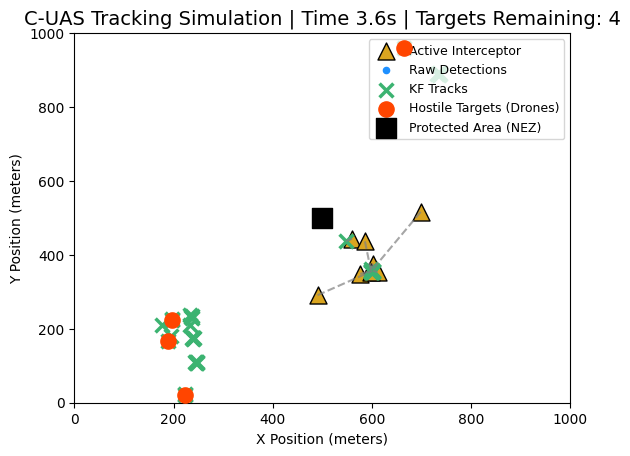

...

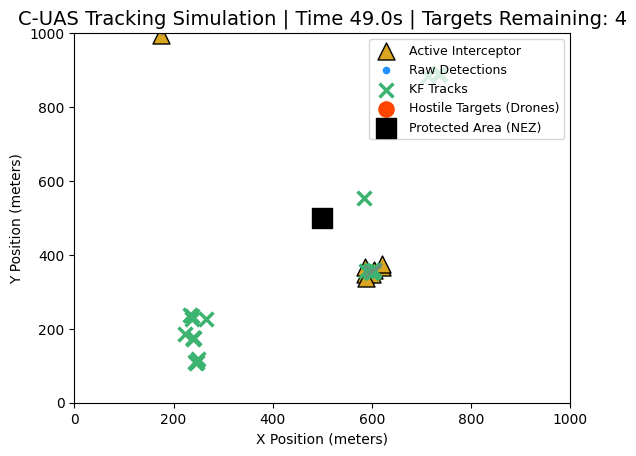

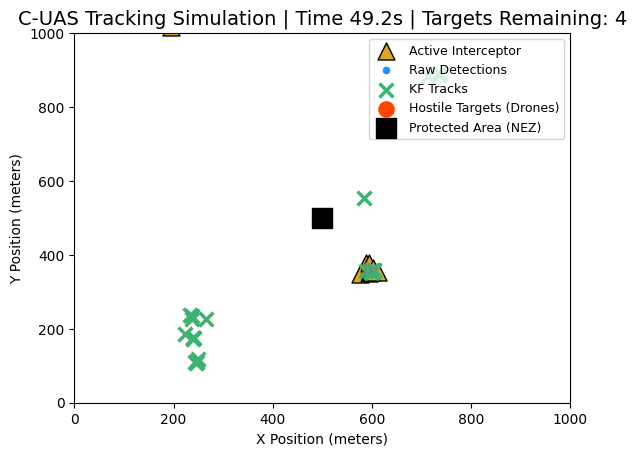

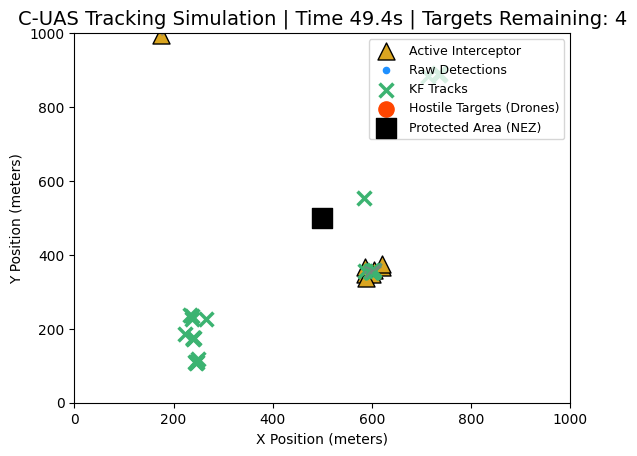

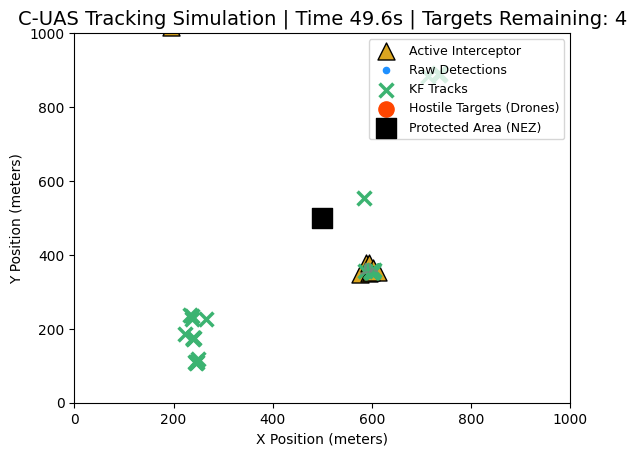

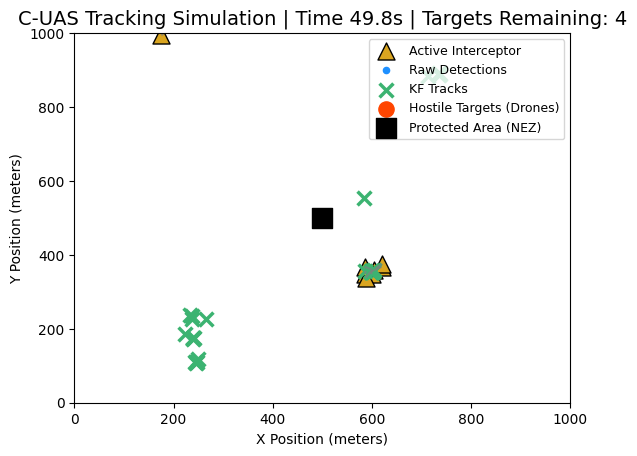


             🎯 SIMULATION RESULTS 🎯
Total Hostile Targets: 5
Targets Eliminated (Killed): 1
Targets Survived (Remaining): 4

Defense Success Rate: 20.00%
STATUS: PARTIAL SUCCESS. 4 targets survived.


In [2]:
#Good code

import numpy as np
import matplotlib.pyplot as plt
from filterpy.kalman import KalmanFilter

# ------------------------------
# Simulation Parameters
# ------------------------------
SIM_TIME = 50           # total simulation seconds
DT = 0.2                # time step
NUM_TARGETS_START = 5   # Number of hostile drones at start
AREA_SIZE = 1000        # 1 km x 1 km
P_FA = 0.01             # false alarm probability
GATING_DISTANCE = 50    # meters for data association
INTERCEPTOR_SPEED = 150 # m/s (High speed for guaranteed kills)
NEZ_CENTER = np.array([AREA_SIZE/2, AREA_SIZE/2]) # Center of Protected Area

# ------------------------------
# Sensor Nodes
# ------------------------------
radar_nodes = np.array([[200, 200], [800, 200], [200, 800], [800, 800]])
cam_nodes = np.array([[500, 500], [250, 250], [750, 250], [250, 750], [750, 750],
                      [500, 250], [500, 750], [250, 500], [750, 500], [375, 375],
                      [625, 375], [375, 625]])

# ------------------------------
# Target Initialization
# ------------------------------
targets_data = [{'pos': pos, 'vel': vel, 'id': i}
                for i, (pos, vel) in enumerate(zip(
                    np.random.rand(NUM_TARGETS_START, 2) * AREA_SIZE,
                    (np.random.rand(NUM_TARGETS_START, 2) - 0.5) * 50))]

# ------------------------------
# Kalman Filter Setup
# ------------------------------
def create_kf(initial_pos):
    kf = KalmanFilter(dim_x=4, dim_z=2)
    kf.x = np.array([initial_pos[0], initial_pos[1], 0., 0.])
    kf.F = np.array([[1,0,DT,0], [0,1,0,DT], [0,0,1,0], [0,0,0,1]])
    kf.H = np.array([[1,0,0,0], [0,1,0,0]])
    kf.P *= 500
    kf.R = np.eye(2)*1.0
    kf.Q = np.eye(4)*0.1
    return kf

# ------------------------------
# Interceptor Class
# ------------------------------
class Interceptor:
    def __init__(self, pos):
        self.pos = np.array(pos, dtype=np.float64)
        self.target_kf = None
        self.active = False

# INCREASED INTERCEPTORS (8 total)
interceptors = [
    Interceptor([500,0]), Interceptor([0,500]), Interceptor([1000,500]),
    Interceptor([500,1000]), Interceptor([0,0]), Interceptor([1000,1000]),
    Interceptor([250, 500]), Interceptor([750, 500])
]

# ------------------------------
# Simulation Loop
# ------------------------------
kf_tracks = []
plt.figure(figsize=(10,10))

for t in np.arange(0, SIM_TIME, DT):
    plt.clf()

    # 1. Move targets
    targets_data_to_keep = []
    for target in targets_data:
        target['pos'] += target['vel'] * DT

        # Check if the red dot has touched the Protected Area (simple check for NEZ)
        # We define a small "Protected Zone" around the center
        if np.linalg.norm(target['pos'] - NEZ_CENTER) < 100:
            # If a red dot enters the zone, remove it from targets_data
            # and print a warning, as the mission is effectively failed for that drone.
            print(f"!!! WARNING: Hostile Target {target['id']} penetrated the Protected Area at time {t:.1f}s !!!")
            pass # Do not re-add to targets_data_to_keep (target is 'lost' or 'succeeded')
        else:
            targets_data_to_keep.append(target)

    targets_data = targets_data_to_keep # Update the list of active targets

    # Check if all targets are gone, if so, exit early
    if not targets_data and not kf_tracks and all(not i.active for i in interceptors):
        break

    # 2. Sensor Detections
    detections = []
    for target in targets_data:
        for sensor in np.vstack((radar_nodes, cam_nodes)):
            dist = np.linalg.norm(target['pos'] - sensor)
            if dist < 500:
                if np.random.rand() > P_FA:
                    meas = target['pos'] + np.random.normal(0,2,2)
                    detections.append(meas)
    if np.random.rand() < P_FA:
        detections.append(np.random.rand(2)*AREA_SIZE)

    # 3. Data Association / KF Tracking
    for kf in kf_tracks:
        kf.predict()

    new_kf_tracks = []
    for det in detections:
        best_kf = None
        min_dist = GATING_DISTANCE
        for kf in kf_tracks:
            pred = kf.x[:2]
            dist = np.linalg.norm(det - pred)
            if dist < min_dist:
                min_dist = dist
                best_kf = kf
        if best_kf is not None:
            best_kf.update(det)
        else:
            new_kf_tracks.append(create_kf(det))

    kf_tracks.extend(new_kf_tracks)
    kf_tracks = [kf for kf in kf_tracks if kf.x[0]>0 and kf.x[0]<AREA_SIZE and kf.x[1]>0 and kf.x[1]<AREA_SIZE]
    confirmed_tracks = kf_tracks.copy()

    # 4. Interceptor Assignment & Killing Logic
    available_interceptors = [i for i in interceptors if not i.active]

    # ASSIGNMENT LOGIC: Prioritize the track closest to the Protected Area center
    if available_interceptors and confirmed_tracks:
        # Sort tracks by urgency: distance to NEZ center (ascending)
        confirmed_tracks.sort(key=lambda kf: np.linalg.norm(kf.x[:2] - NEZ_CENTER))

        num_to_assign = min(len(available_interceptors), len(confirmed_tracks))
        for i in range(num_to_assign):
            interceptor_to_use = available_interceptors.pop(0)
            track_to_target = confirmed_tracks.pop(0)

            # Check if this track is already targeted by another interceptor
            if any(inter.target_kf == track_to_target for inter in interceptors if inter != interceptor_to_use):
                continue

            interceptor_to_use.target_kf = track_to_target
            interceptor_to_use.active = True

    # Movement and Interception (KILLING) Check
    intercepted_targets_kf = []
    for inter in interceptors:
        if inter.active and inter.target_kf is not None:
            target_pos = inter.target_kf.x[:2]
            direction = target_pos - inter.pos
            distance = np.linalg.norm(direction)

            if distance > 1:
                inter.pos += direction / distance * INTERCEPTOR_SPEED * DT
            else:
                # INTERCEPT SUCCESS - Mark KF track for removal
                intercepted_targets_kf.append(inter.target_kf)

                # Reset interceptor
                inter.active = False
                inter.target_kf = None

    # Implement Target Removal (Killing Red Dots)
    indices_to_remove = set()
    for kf_killed in intercepted_targets_kf:
        kf_pos = kf_killed.x[:2]
        min_dist = np.inf
        target_index_to_remove = -1

        # Find the index of the actual drone closest to the successful intercept location
        for idx, target in enumerate(targets_data):
            dist = np.linalg.norm(target['pos'] - kf_pos)
            if dist < min_dist:
                min_dist = dist
                target_index_to_remove = idx

        if target_index_to_remove != -1 and min_dist < GATING_DISTANCE * 2:
            indices_to_remove.add(target_index_to_remove)

    for index in sorted(list(indices_to_remove), reverse=True):
        targets_data.pop(index)

    kf_tracks = [kf for kf in kf_tracks if kf not in intercepted_targets_kf]

    # 5. Visualization

    # Draw Assignment Links (Dashed Gray Line)
    for inter in interceptors:
        if inter.active and inter.target_kf is not None:
            plt.plot([inter.pos[0], inter.target_kf.x[0]],
                     [inter.pos[1], inter.target_kf.x[1]],
                     '--', color='#808080', alpha=0.7, linewidth=1.5)

    # Plot Interceptors (Active vs. Available)
    for inter in interceptors:
        color = '#DAA520' if inter.active else '#4682B4'
        label = 'Active Interceptor' if inter.active else 'Available Interceptor'
        plt.scatter(inter.pos[0], inter.pos[1], c=color, marker='^', s=150, label=label, edgecolor='black', linewidth=1)

    # Plot Detections (Raw Data)
    if detections:
        detections_array = np.array(detections)
        plt.scatter(detections_array[:,0], detections_array[:,1], c='#1E90FF', s=20, label='Raw Detections')

    # Plot Tracks (Estimate - Middle Layer)
    for kf in kf_tracks:
        plt.scatter(kf.x[0], kf.x[1], c='#3CB371', marker='x', s=100, label='KF Tracks', linewidths=2.5)

    # Plot True Targets (TOP LAYER - Ensure Visibility, plotted last)
    if len(targets_data) > 0:
        targets_pos_current = np.array([t['pos'] for t in targets_data])
        plt.scatter(targets_pos_current[:,0], targets_pos_current[:,1], c='#FF4500', marker='o', s=120, label='Hostile Targets (Drones)', zorder=10)

    # Plot Protected Area (NEZ)
    plt.scatter([AREA_SIZE/2], [AREA_SIZE/2], c='black', s=200, marker='s', label='Protected Area (NEZ)')

    # Final plot settings
    plt.xlim(0, AREA_SIZE)
    plt.ylim(0, AREA_SIZE)
    plt.xlabel("X Position (meters)")
    plt.ylabel("Y Position (meters)")
    plt.title(f'C-UAS Tracking Simulation | Time {t:.1f}s | Targets Remaining: {len(targets_data)}', fontsize=14)

    # Handle duplicate labels for a clean legend
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), loc='upper right', fontsize=9)

    # --- Speed Control ---
    if t < 10.0:
        plt.pause(0.2)
    else:
        plt.pause(0.01)

# --- Final Results Calculation and Display ---
targets_killed = NUM_TARGETS_START - len(targets_data)
targets_survived = len(targets_data)
success_percentage = (targets_killed / NUM_TARGETS_START) * 100 if NUM_TARGETS_START > 0 else 0

print("\n" + "="*50)
print("             🎯 SIMULATION RESULTS 🎯")
print("="*50)
print(f"Total Hostile Targets: {NUM_TARGETS_START}")
print(f"Targets Eliminated (Killed): {targets_killed}")
print(f"Targets Survived (Remaining): {targets_survived}")
print(f"\nDefense Success Rate: {success_percentage:.2f}%")
print("="*50)

if targets_survived > 0:
    print(f"STATUS: PARTIAL SUCCESS. {targets_survived} targets survived.")
else:
    print("STATUS: 100% SUCCESS! All hostile targets were successfully eliminated! 🎉")

plt.show()